In [20]:
from torchvision.models import vgg19, VGG19_Weights
from torch.autograd import Variable
from collections import OrderedDict
from functools import reduce
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm, trange

In [2]:
image_size = 512 
is_cuda = torch.cuda.is_available()

preprocessing = transforms.Compose([transforms.Resize(image_size),
                           transforms.ToTensor(),
                           transforms.Lambda(lambda x: x[torch.LongTensor([2,1,0])]), 
                           transforms.Normalize(mean=[0.40760392, 0.45795686, 0.48501961], 
                                                std=[1,1,1]),
                           transforms.Lambda(lambda x: x.mul_(255)),
                          ])
processing = transforms.Compose([transforms.Lambda(lambda x: x.mul_(1./255)),
                           transforms.Normalize(mean=[-0.40760392, -0.45795686, -0.48501961], 
                                                std=[1,1,1]),
                           transforms.Lambda(lambda x: x[torch.LongTensor([2,1,0])]), 
                           ])
postprocess = transforms.Compose([transforms.ToPILImage()])

def postprocess_b(tensor): 
    t = processing(tensor)
    t[t>1] = 1    
    t[t<0] = 0
    img = postprocess(t)
    return img

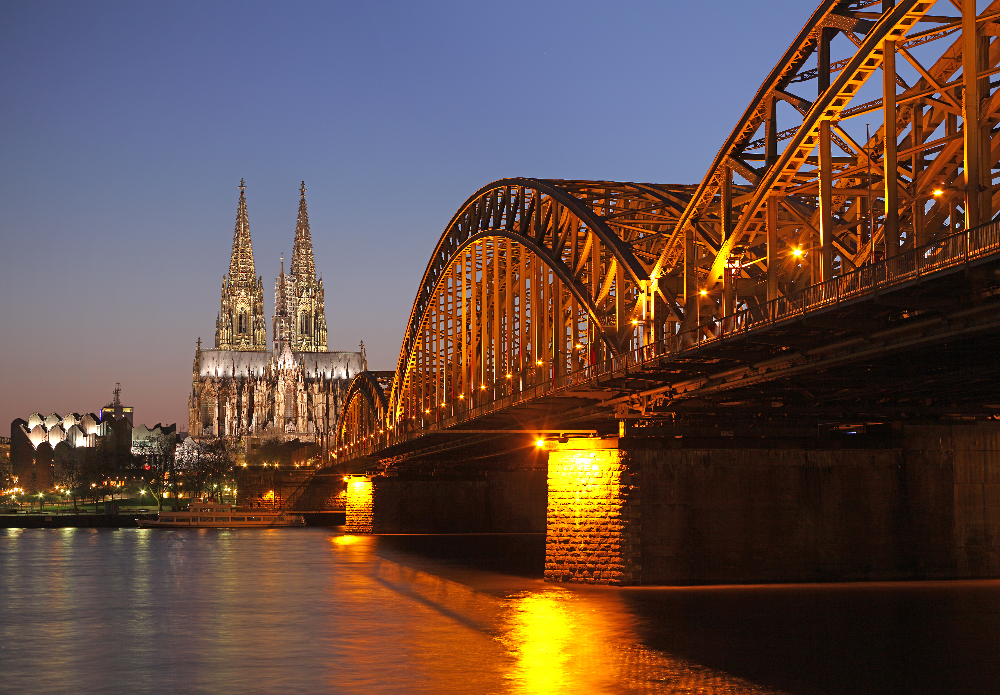

In [21]:
from IPython.display import Image as IPImage
IPImage('content/Hohenzollernbrücke_Köln.jpg')

In [22]:
def loader(image_name):
    image = Image.open(image_name)
    image = Variable(preprocessing(image))
    # fake batch dimension required to fit network's input dimensions
    image = image.unsqueeze(0)
    return image

In [23]:
class LayerActivations():
    features=[]
    
    def __init__(self,model,layer_nums):
        
        self.hooks = []
        for layer_num in layer_nums:
            self.hooks.append(model[layer_num].register_forward_hook(self.hook_fn))
    
    def hook_fn(self,module,input,output):
        self.features.append(output)

    
    def remove(self):
        for hook in self.hooks:
            hook.remove()

In [24]:
class GramMatrix(nn.Module):
    
    def forward(self,input):
        b,c,h,w = input.size()
        features = input.view(b,c,h*w)
        gram_matrix =  torch.bmm(features,features.transpose(1,2))
        gram_matrix.div_(h*w)
        return gram_matrix
        
class StyleLoss(nn.Module):
    
    def forward(self,inputs,targets):
        out = nn.MSELoss()(GramMatrix()(inputs),targets)
        return (out)

In [25]:
def extract_layers(layers, img, model=None):
    la = LayerActivations(model,layers)
    #Clearing the cache 
    la.features = []
    out = model(img)
    la.remove()
    return la.features

In [30]:
vgg = vgg19(weights=VGG19_Weights.DEFAULT).features
for param in vgg.parameters():
    param.requires_grad = False

In [27]:
vgg

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace=True)
  (18): MaxPoo

In [40]:
def style_transfer(style_image, content_image, maximum_iterations=1000, vgg=vgg):

    if is_cuda:
        style_image = style_image.cuda()
        content_image = content_image.cuda()
        vgg = vgg.cuda()
    
    style_layers = [1,6,11,20,25]
    #content_layers = [21]
    content_layers = [-1, -5, -15]
    
    style_weights = [1e3/n**2 for n in [64, 128, 256, 512, 512]]
    #style_weights = [1e3/n**2 for n in [64, 64, 256, 512, 512]]
    #style_weights = [1e3/n**2 for n in [512, 512, 256, 128, 64]]
    content_weights = [1e0, 1e0, 1e0]
    
    loss_layers = style_layers + content_layers
    weights = style_weights + content_weights
    
    content_targets = extract_layers(content_layers, content_image, model=vgg)
    content_targets = [t.detach() for t in content_targets]
    
    style_targets = extract_layers(style_layers, style_image, model=vgg)
    style_targets = [GramMatrix()(t).detach() for t in style_targets]

    # this is a fixed target with content from the content image and style from the style image
    targets = style_targets + content_targets
    
    loss_fns = [StyleLoss()] * len(style_layers) + [nn.MSELoss()] * len(content_layers)
    if is_cuda:
        loss_fns = [fn.cuda() for fn in loss_fns]

    output_image = Variable(content_image.data.clone(),requires_grad=True)

    #run style transfer
    show_iteration = 50
    optimizer = optim.LBFGS([output_image]);
    #optimizer = optim.Adam([output_image]);
    
    with tqdm(total=maximum_iterations) as pbar:
        while pbar.n < pbar.total:
            def closure():
                optimizer.zero_grad()

                out = extract_layers(loss_layers, output_image, model=vgg)
                layer_losses = [weights[a] * loss_fns[a](A, targets[a]) for a,A in enumerate(out)]
                loss = reduce(torch.add, layer_losses)
                loss.backward()
                pbar.update()
                pbar.set_postfix({'loss': loss.item()})

                return loss

            optimizer.step(closure)

    out_img_hr = postprocess_b(output_image.data[0].cpu().squeeze())

    plt.imshow(out_img_hr)
    ax = plt.gca()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    plt.gcf().set_size_inches(10, 10)
    plt.show()
    

  0%|          | 0/1000 [00:00<?, ?it/s]

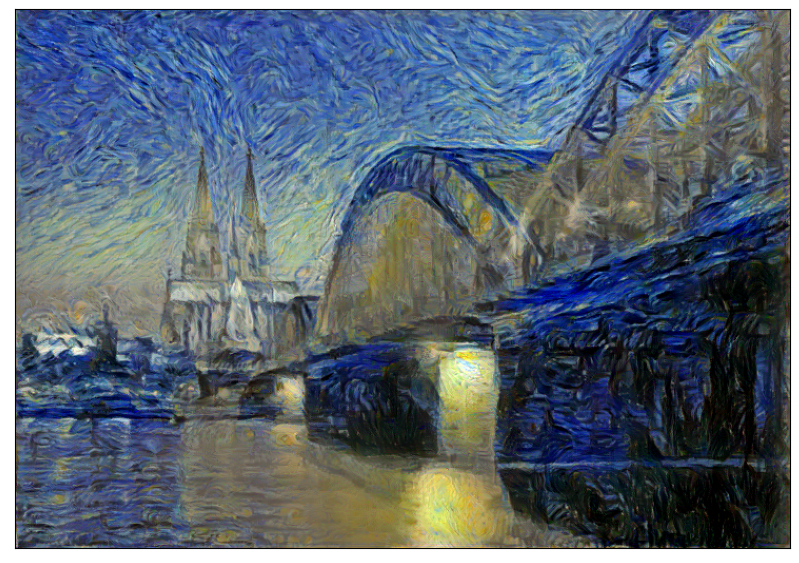

In [37]:
style_image = loader("style/style_image.jpg")
content_image = loader("content/Hohenzollernbrücke_Köln.jpg")

style_transfer(style_image, content_image)

  0%|          | 0/2000 [00:00<?, ?it/s]

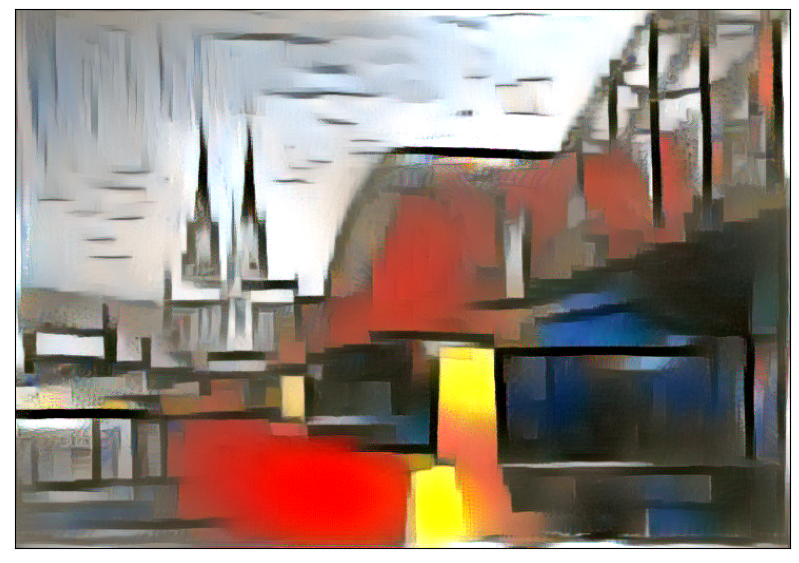

In [38]:
style_image = loader("style/mondrian.jpg")
content_image = loader("content/Hohenzollernbrücke_Köln.jpg")

style_transfer(style_image, content_image, maximum_iterations=2000)

  0%|          | 0/1000 [00:00<?, ?it/s]

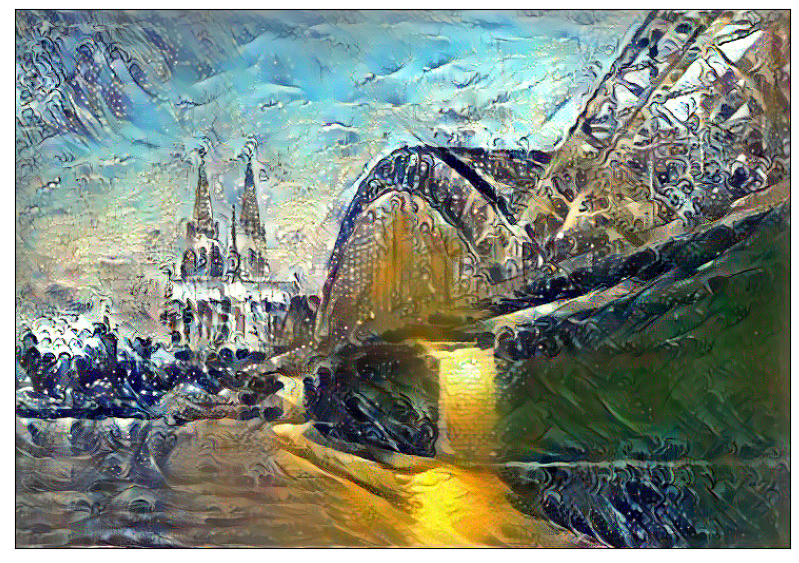

In [41]:
style_image = loader("style/hokusai.jpg")
content_image = loader("content/Hohenzollernbrücke_Köln.jpg")

style_transfer(style_image, content_image)